BRICS QUERY TOOL APPLICATION PROGRAMMING INTERFACE

## Purpose: 
### The purpose of this notebook is to provide examples of the different endpoints for the Query Tool API using Python. 

### For More Information regarding Query-API endpoints please see 
FITBIR: https://fitbir.nih.gov/gateway/query-api/swagger-ui/index.html </br>
PDBP: https://pdbp.ninds.nih.gov/gateway/query-api/swagger-ui/index.html </br>
NEI: https://brics.nei.nih.gov/gateway/query-api/swagger-ui/index.html </br>
CdRns: https://cdrns.nih.gov/gateway/query-api/swagger-ui/index.html </br>

### For additional questions, please refer to the PDF API User Guide and additional Demo Jupyter Notebooks


## Instructions:
 1. Import the Python Dependencies. 
 2. Authenticate user permissions and retrieve access token.
 3. Create and send a query for the specific endpoint.
     - If the response 200, it means that the query was submitted successfully. For more information about the status codes please refer to this link: https://httpstatuses.com/
 4. Save the data in a dataframe or in folder to perform analysis. 
 
 

# Table of contents
- [I) Set BRICs Instance ](#I)
- [II) Authentication](#II)
- [III) Study API (Get Studies)](#III)
    - [A) Get all Study Information](#IIIA)
    - [B) Get Study Information for one study](#IIIB)
    - [C) Get All Studies Associated With a Form Structure](#IIIC)
- [IV) Form Structure API (Get Forms)](#IV)
    - [A) Get Form Structures for a Study](#IVA)
- [V) Data Element API (Get Data Elements)](#V)
    - [A) Get Data Elements from a Form Structure](#VA)
- [VI) Data API (Get Data Stored in the Form Structures)](#VI)
    - [A) Get data from multiple form structures without doing joins](#VIA)
    - [B) Return data with a filter](#B)
        - [i) Output CSV Format](#Bi)
        - [ii)Output JSON Format](#Bii)

In [1]:
#Import Python Dependencies
import pandas as pd
import requests
import json
import getpass
from io import StringIO
import os
import datetime as dt
import time
import sys

In [2]:
# define function for automatically creating an output folder 
def create_folder(folder_path):
    adjusted_folder_path = folder_path
    folder_found = os.path.isdir(adjusted_folder_path)
    counter = 0
    while folder_found == True:
        counter = counter + 1
        adjusted_folder_path = folder_path + ' (' + str(counter) + ')'
        folder_found = os.path.isdir(adjusted_folder_path)
    os.mkdir(adjusted_folder_path)
    return adjusted_folder_path

x=dt.datetime.now()
new_dir = os.getcwd()+'\\'+"BRICsQueryTool_"+x.strftime('%Y_%m_%d')+"_outputfiles"
created_dir = create_folder(new_dir)
print('New Directory Created: ' + new_dir)

New Directory Created: C:\Users\bagonismm\Desktop\Coding\api-development\QueryToolandAPIPresentation_04112024\UserGuides\BRICsQueryTool_2024_04_10_outputfiles


# Set BRICs Instance <a name="I"></a>
**Note the Query-API is designed similarly for all BRICs instances**:
Endpoint names will be identical except for the name of the BRICs Instance </br>
</br>
**BRICs Instances:** </br>
**FITBIR:**'fitbir.nih.gov' </br>
**PDBP:** 'pdbp.ninds.nih.gov' </br>
**NEI:** 'brics.nei.nih.gov' </br>
**CDRNS:** 'cdrns.nih.gov' </br> 


In [3]:
# Set BRICs Instance. Below examples are for 'fitbir.nih.gov'. However, the user can use the below code for any  
# BRICs instance for which the user has access (see available instances listed above). Just set that variable here.
BRICSInstance = 'fitbir.nih.gov'

# Authentication <a name="II"></a>

To access the  Query Tool API the user needs to provide an authentication 'token' in the header of each API request. This token is found by logging on to the user's BRICs account (FITBIR etc) and going to the 'Account Management' tab. Here you will be able to cut and paste the token and set it as a variable (See Below) 



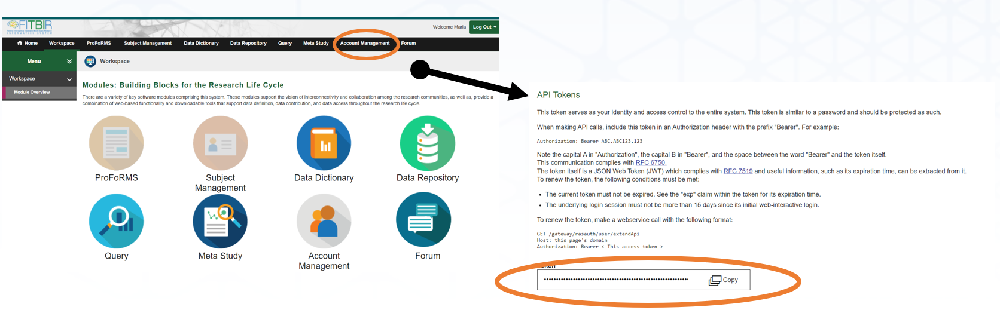

In [4]:
#Set Input token: Tokens can be obtained by logging into your FITBIR repository account and clicking on Account Management tab

#token = maskpass.askpass(prompt="Enter your user token")
token = getpass.getpass('Enter your user token:')

Enter your user token:········


# Study API <a name="III"></a>

## The Study APIs return the following information:
1. Studies with data that the user has access to
2. Information about the a study or studies.
3. Studies associated with a form structure

## GET ALL STUDY INFORMATION <a name="IIIA"></a>
### This service will return all the studies that have data in the instance. Optional it will return information for a study with the Prefix ID (Study ID) provided.  <br/>
See Swagger UI: https://fitbir.nih.gov/gateway/query-api/swagger-ui/index.html#/study/getStudies for more information regarding this endpoint

In [10]:
#get study prefix from title
url = "https://" +  BRICSInstance  + "/gateway/query-api/study"

headers = {
    'accept': 'application/json',
    'Content-type': 'application/json',
     'Authorization':'Bearer ' + token    
}


In [11]:
query = requests.get(url,headers =headers)
query


<Response [200]>

Output: JSON
The user will receive the following information in a JSON format:
1. Study Abstract
2. Study Status
3. Study Prefix ID
4. Study Title
5. Principal Investigator

In [12]:
output = query.json()
output

[{'abstract': 'Every year 1.7 million people sustain a traumatic brain injury (TBI) in the US and of these, 84% are considered mild TBI (mTBI). Although imbalance is one of the most common and debilitating complaints after mTBI, we currently lack clear guidelines on when to initiate rehabilitation and it is unclear if early physical therapy is beneficial. Additionally, while wearable sensor data is not currently used in the clinic to assess or treat balance after mTBI, such technology may improve outcomes. Our research aligns directly with focus areas in JPC-8/CRMRP since we will study people with mTBI who also have complex, multisensory system impairments and complaints of imbalance. This call encourages studies of patients with dizziness and visual dysfunction that are slow to respond to current treatments. Our project also aligns with FY 16 PH/TBIRP CTRRA areas of encouragement for â\x80\x98interventional studies to evaluate emerging or existing rehabilitation strategies for the tre

## Get Study Information for One Study. 
#### Example FITBIR-STUDY0000267 <a name="IIIB"></a>

In [13]:
#get study prefix from title
url ="https://" +  BRICSInstance  + "/gateway/query-api/study?prefixedId="
header = {
    'accept': 'application/json',
    'Content-type': 'application/json',
     'Authorization':'Bearer ' + token    
}

StudyPrefixID = input("Enter Study Prefix")


Enter Study PrefixFITBIR-STUDY0000267


In [14]:
query = requests.get(url + StudyPrefixID,headers = header)
query

<Response [200]>

In [15]:
studyinfo = query.json()
studyinfo

[{'abstract': 'Effective treatment of traumatic brain injury (TBI) remains one of the greatest unmet needs in public health. Each year in the US, at least 1.7 million people suffer TBI; an estimated 3.2 to 5.3 million people live with the long-term physical, cognitive, and psychological health disabilities of TBI, with annual direct and indirect costs estimated at over $60 billion. The unique public-private partnership of investigators, philanthropy, and industry leaders brought together in the multicenter Transforming Research and Clinical Knowledge in Traumatic Brain Injury (TRACK-TBI) proposal share a mission to accelerate clinical research in TBI. The goal is to create a large, high quality TBI database that integrates clinical, imaging, proteomic, genomic, and outcome biomarkers, and provides analytic tools and resources to establish more precise methods for TBI diagnosis and prognosis, improve outcome assessment, and compare the effectiveness and costs of tests, treatments, and s

## GET ALL STUDIES ASSOCIATED WITH A FORM STRUCTURE
### Returns all the studies that have data submitted to the form structure
#### Example Form: [GCS](https://fitbir.nih.gov/dictionary/publicData/dataStructureAction!view.action?dataStructureName=GCS&publicArea=true&style.key=fitbir-style) from FITBIR </br>
Search additional FITBIR Forms Here: https://fitbir.nih.gov/content/data-dictionary#form-structures </br>
See Swagger UI: https://fitbir.nih.gov/gateway/query-api/swagger-ui/index.html#/study/getStudyByFormName for more information regarding this endpoint<a name="IIIC"></a>

In [16]:
url =  "https://" +  BRICSInstance  + "/gateway/query-api/study/form?formName="
header = {
    'accept': 'application/json',
    'Content-type': 'application/json',
     'Authorization':'Bearer ' + token    
}

formstructureshortname = input()

GCS


In [18]:
query = requests.get(url + formstructureshortname,headers=header)
query

<Response [200]>

Output Format: JSON
The user will receive the following information in JSON format:
1. Study Status
2. Study ID
3. Study Title
4. Study Abstract

In [19]:
formstructureinformation = query.json()
formstructureinformation

[{'form': 'GCS',
  'studies': [{'abstract': 'Activity-related concussion is a growing epidemic particularly in collegiate athletes. The cumulative effective of multiple concussions necessitates that return-to-activity testing post-concussion are both appropriate and sensitive in determining the readiness of the individual to return to the field. Postural stability has been shown to be a good indicator of recovery following a concussive episode. The Balance Error Scoring System (BESS) is the most widely used clinical assessment of postural stability with post-concussion athletes, yet it lacks adequate quantitative metrics needed to detect subtle changes in stability. The Virtual Environment Traumatic brain injury (TBI) Screen (VETS) device is a new assessment tool that can potentially be used to measure postural stability in healthy and neurologically impaired individuals. The VETS is a variation of our previously approved (closed) IRB approved protocol (20839) for validation of our The

# Form Structure API <a name="IV"></a>

## GET FORM STRUCTURES FOR A STUDY
### Returns all the form structures that have data submitted for the study. 
#### Example FITBIR-STUDY0000267 <a name="IVA"></a>
<br/> See Swagger UI: https://fitbir.nih.gov/gateway/query-api/swagger-ui/index.html#/form/getFormByStudyPrefixedId for more information regarding this endpoint


In [20]:
url = "https://" +  BRICSInstance  + "/gateway/query-api/form/study?prefixedId="

headers = {
    'accept': 'application/json',
    'Content-type': 'application/json',
     'Authorization':'Bearer ' + token    
}
studyid = input("Enter Study PrefixID ")

Enter Study PrefixID FITBIR-STUDY0000267 


In [21]:
query= requests.get(url + studyid, headers = headers)
query

<Response [200]>

Output Format: JSON 
The user will receive the following information in JSON format
1. Study ID
2. Forms associated with the Study
    - Form Structure Short Name
    - Form Structure title
    - Form Structure Version

In [22]:
studyformstructuredata = query.json()
studyformstructuredata



[{'studyId': 'FITBIR-STUDY0000267',
  'forms': [{'id': 2314,
    'shortName': 'AIS',
    'title': 'Abbreviated Injury Scale (AIS)',
    'version': '1.0'},
   {'id': 2727,
    'shortName': 'AIS_Appdx_TRACKTBI',
    'title': 'Abbreviated Injury Scale (AIS) Appendix for TRACK-TBI',
    'version': '1.0'},
   {'id': 2575,
    'shortName': 'AUDITC',
    'title': 'Alcohol Use Disorders Identification Test  - Consumption Questions (AUDIT-C)',
    'version': '1.2'},
   {'id': 2782,
    'shortName': 'AUDITC_Appdx_TRACKTBI',
    'title': 'Alcohol Use Disorders Identification Test - Consumption Questions (AUDIT-C) Appendix for TRACK-TBI',
    'version': '1.0'},
   {'id': 2641,
    'shortName': 'Adverse_Events_FITBIR',
    'title': 'FITBIR Adverse Events',
    'version': '1.3'},
   {'id': 2722,
    'shortName': 'AdvrseEvnts_Appdx_TRACKTBI',
    'title': 'FITBIR Adverse Events Appendix for TRACK-TBI',
    'version': '1.0'},
   {'id': 2584,
    'shortName': 'BSI18',
    'title': 'Brief Symptoms Inven

# Data Elements API <a name="V"></a>

## GET DATA ELEMENTS FOR A FORM STRUCTURE
### Return all data elements associated with the form structure. 
#### Example Form: [GCS](https://fitbir.nih.gov/dictionary/publicData/dataStructureAction!view.action?dataStructureName=GCS&publicArea=true&style.key=fitbir-style) from FITBIR </br>
Search additional FITBIR Forms Here: https://fitbir.nih.gov/content/data-dictionary#form-structures </br>
See Swagger UI: https://fitbir.nih.gov/gateway/query-api/swagger-ui/index.html#/dataElement/getDataElementsByFormNames for more information regarding this endpoint<a name="VA"></a>

In [24]:
url = "https://" +  BRICSInstance  + "/gateway/query-api/dataElement/form/"

headers = {
#     'accept': 'application/json',
    'Content-type': 'application/json',
    'Authorization':'Bearer ' + token    
}

# print("Input Form Structure Short Name")
formstructureshortname = input()


GCS


In [25]:
dataelementapiquery = requests.get(url + formstructureshortname,headers = headers)
dataelementapiquery

<Response [200]>

Output Format: JSON
The user will receive the following information from the JSON.
1. Repeatable Group Name
2. Position in the Form Structure
3. Data Element ID
4. Name and Title of Data Element
5. Description of Data Element
6. Data Type
7. Input Restriction 
8. Required Type

In [26]:
dataelementapiinformation = dataelementapiquery.json()
dataelementapiinformation

[{'name': 'Main',
  'position': 0,
  'threshold': 1,
  'dataElements': [{'id': 69410,
    'name': 'GUID',
    'title': 'GUID',
    'description': 'Global Unique ID (GUID) which uniquely identifies a subject',
    'dataType': 'GUID',
    'inputRestriction': 'Free-Form Entry',
    'requiredType': 'Required'},
   {'id': 69738,
    'name': 'SubjectIDNum',
    'title': 'Subject identifier number',
    'description': 'An identification number assigned to the participant/subject within a given protocol or a study.',
    'dataType': 'Alphanumeric',
    'inputRestriction': 'Free-Form Entry',
    'requiredType': 'Optional'},
   {'id': 70501,
    'name': 'AgeYrs',
    'title': 'Age in years',
    'description': "Value for participant's subject age, calculated as elapsed time since the birth of the participant/subject in years. The subjects age is typically recorded to the nearest full year completed, e.g. 11 years and 6 months should be recorded as 11 years.",
    'dataType': 'Numeric Values',
  

# Data API <a name="VI"></a>

## GET DATA FROM MULTIPLE FORM STRUCTURES WITHOUT DOING JOINS
#### Example Below Uses Form1 = GCS and Form2 = Imaging Diffusion from FITBIR <a name="VIA"></a>
#### See Swagger-UI https://fitbir.nih.gov/gateway/query-api/swagger-ui/index.html#/data/bulkSingleForm for more information regarding this endpoint

In [27]:
# set input parameters: 
# Input any form structures associated with your BRICs instance of interest (use short name)
form1 = 'GCS'
form2 = 'ImagingDiffusion'

# Input any study study prefix ID 
study1 = ['FITBIR-STUDY0000409'] 
study2 = ['FITBIR-STUDY0000267']

In [28]:
multipleformsheader = {
    'Content-type': 'application/json',
    'Authorization':'Bearer ' + token
    }

multipleformsurl = "https://" +  BRICSInstance  + "/gateway/query-api/data/bulk/form/study"

In [29]:
multipleformsfilter ={
  "flattened": "false",
  "formStudies": [
    {
      "form": form1,
      "studies": 
        study1
    },
    {
      "form": form1,
      "studies": 
        study2
    },
    {
      "form": form2,
      "studies": 
        study1
    },
    {
      "form": form2,
      "studies": 
        study2
    }
  ]  
  ,
  "outputFormat": "csv"
}

In [30]:
multipleformsquery = requests.post(multipleformsurl,headers = multipleformsheader,json = multipleformsfilter)
multipleformsquery

<Response [200]>

In [31]:
multipleformsquery.headers

{'Date': 'Wed, 10 Apr 2024 13:31:06 GMT', 'Server': 'Apache', 'X-Content-Type-Options': 'nosniff', 'X-Frame-Options': 'sameorigin', 'X-Xss-Protection': '1; mode=block', 'Referrer-Policy': 'strict-origin-when-cross-origin, no-referrer', 'Strict-Transport-Security': 'max-age=63072000;includeSubdomains;preload', 'Vary': 'Origin,Access-Control-Request-Method,Access-Control-Request-Headers', 'Cache-Control': 'no-cache, no-store, must-revalidate', 'Pragma': 'no-cache', 'Expires': '0', 'Content-Disposition': 'attachment;filename="bulkForm_2024-04-10T09-31-052168278122481513904.zip"', 'Content-Type': 'application/zip', 'Keep-Alive': 'timeout=5, max=100', 'Connection': 'Keep-Alive', 'Transfer-Encoding': 'chunked'}

Output Format: Zipped CSV Files
Extract all .csvs and save them locally 

In [32]:
# Extract all .csv files from zip 
import zipfile, io
z = zipfile.ZipFile(io.BytesIO(multipleformsquery.content))
z.extractall(created_dir)

In [33]:
#file information
import glob
files = sorted(glob.glob(created_dir + '/*.csv'))

for file in files:
    print("Here is the location of your files: " + file)
    print("_____________________________________________")



Here is the location of your files: C:\Users\bagonismm\Desktop\Coding\api-development\QueryToolandAPIPresentation_04112024\UserGuides\BRICsQueryTool_2024_04_10_outputfiles\query_result_GCS_2024-04-10T09-30-464513621180269995292.csv
_____________________________________________
Here is the location of your files: C:\Users\bagonismm\Desktop\Coding\api-development\QueryToolandAPIPresentation_04112024\UserGuides\BRICsQueryTool_2024_04_10_outputfiles\query_result_GCS_2024-04-10T09-31-0017826347010607676307.csv
_____________________________________________
Here is the location of your files: C:\Users\bagonismm\Desktop\Coding\api-development\QueryToolandAPIPresentation_04112024\UserGuides\BRICsQueryTool_2024_04_10_outputfiles\query_result_ImagingDiffusion_2024-04-10T09-31-03786940054294527485.csv
_____________________________________________
Here is the location of your files: C:\Users\bagonismm\Desktop\Coding\api-development\QueryToolandAPIPresentation_04112024\UserGuides\BRICsQueryTool_2024

## Return data with a data element value filter <a name="B"></a>


#### Define Filter on Data Element (as defined by Form.RepeatableGroup.dataElement) Values <br/> 
Here use FITBIR GCS.Main.AgeYrs (20-50) AND DemogrFITBIR.Subject Demographics.GenderTyp (Female) <br/>
This filter can be input into either the CSV or JSON endpoint 


In [34]:
# get GCS and DemogrFITBIR forms joined for FITBIR-STUDY0000267
# for female subjects 20-50 years of age
filterForQuery = {
    "formStudy": [
        {
            "form": 'GCS',
            "studies": ['FITBIR-STUDY0000267']
        },
        {
            "form": "DemogrFITBIR",
            "studies": ['FITBIR-STUDY0000267']
        },
    ],
    "filter": [
        {
            "dataElement": "AgeYrs",
            "form": "GCS",
            "repeatableGroup": "Main",
            "operator":"AND",
            "rangeStart": "20",
            "rangeEnd": "50",
            "mode": "inclusive"
            
        },
        {
            "dataElement": "GenderTyp",
            "form": "DemogrFITBIR",
            "repeatableGroup": "Subject Demographics",
            "value": [
                "Female"
            ]
        }
    ]
}

### Output CSV Format <a name="Bi"></a>
See Swagger-UI https://fitbir.nih.gov/gateway/query-api/swagger-ui/index.html#/data/getInstancedDataCsv for more information regarding this endpoint

In [35]:
queryurl = "https://" +  BRICSInstance  + "/gateway/query-api/data/csv"

headers = {
    'accept': 'application/zip',
    'Content-type': 'application/json',
    'Authorization':'Bearer ' + token }

In [36]:
query = requests.post(queryurl,headers=headers,json=filterForQuery)
query

<Response [200]>

In [37]:
print(f"Response: {query}")
print("Data received: " + query.headers["Content-Disposition"][21:96]) 

Response: <Response [200]>
Data received: query_result_GCS_join_DemogrFITBIR_2024-04-10T09-32-1314825941161510811561.


In [38]:
pd.set_option('display.max_columns', None)
dataset = query.text
texttodf = StringIO(dataset)
fitbir_data = pd.read_csv(texttodf, sep=",",low_memory=False)
fitbir_data.head()

,GUID,GCS.Study ID,GCS.Dataset,GCS.Main.GUID,GCS.Main.ASSOCIATED GUID,GCS.Main.SubjectIDNum,GCS.Main.AgeYrs,GCS.Main.VitStatus,GCS.Main.VisitDate,GCS.Main.SiteName,GCS.Main.DaysSinceBaseline,GCS.Main.CaseContrlInd,GCS.Main.GeneralNotesTxt,GCS.Form Administration.ContextType,GCS.Form Administration.ContextTypeOTH,GCS.Form Administration.DataSource,GCS.Form Administration.DataSourceOTH,GCS.Glasgow Coma Scale.GCSConfounderTyp,GCS.Glasgow Coma Scale.GCSEyeRespnsScale,GCS.Glasgow Coma Scale.GCSMotorRespnsScale,GCS.Glasgow Coma Scale.GCSVerbalRspnsScale,GCS.Glasgow Coma Scale.GCSTotalScore,GCS.Glasgow Coma Scale.PupilReactivityLghtLftEyeReslt,GCS.Glasgow Coma Scale.PupilReactivityLghtRtEyeReslt,GCS.Glasgow Coma Scale.PupilLftEyeMeasr,GCS.Glasgow Coma Scale.PupilRtEyeMeasr,GCS.Glasgow Coma Scale.PupilShapeLftEyeTyp,GCS.Glasgow Coma Scale.PupilShapeRtEyeTyp,GCS.Pediatric Glasgow Coma Scale.GCSConfounderTyp,GCS.Pediatric Glasgow Coma Scale.PGCSEyeRespnsScore,GCS.Pediatric Glasgow Coma Scale.PGCSMotorRespnsScore,GCS.Pediatric Glasgow Coma Scale.PGCSVerbalRespnsScore,GCS.Pediatric Glasgow Coma Scale.PGCSTotalScore,GCS.Pediatric Glasgow Coma Scale.PupilReactivityLghtLftEyeReslt,GCS.Pediatric Glasgow Coma Scale.PupilReactivityLghtRtEyeReslt,GCS.Pediatric Glasgow Coma Scale.PupilLftEyeMeasr,GCS.Pediatric Glasgow Coma Scale.PupilRtEyeMeasr,GCS.Pediatric Glasgow Coma Scale.PupilShapeLftEyeTyp,GCS.Pediatric Glasgow Coma Scale.PupilShapeRtEyeTyp,DemogrFITBIR.Study ID,DemogrFITBIR.Dataset,DemogrFITBIR.Main Group.GUID,DemogrFITBIR.Main Group.ASSOCIATED GUID,DemogrFITBIR.Main Group.SubjectIDNum,DemogrFITBIR.Main Group.AgeYrs,DemogrFITBIR.Main Group.VisitDate,DemogrFITBIR.Main Group.SiteName,DemogrFITBIR.Main Group.DaysSinceBaseline,DemogrFITBIR.Main Group.CaseContrlInd,DemogrFITBIR.Main Group.GeneralNotesTxt,DemogrFITBIR.Form Administration.ContextType,DemogrFITBIR.Form Administration.ContextTypeOTH,DemogrFITBIR.Form Administration.DataSource,DemogrFITBIR.Form Administration.DataSourceOTH,DemogrFITBIR.Subject Demographics.BirthDate,DemogrFITBIR.Subject Demographics.GenderTyp,DemogrFITBIR.Subject Demographics.SexSubjectGenotypTyp,DemogrFITBIR.Subject Demographics.SexSubjectGenotypOTH,DemogrFITBIR.Subject Demographics.HandPrefTyp,DemogrFITBIR.Subject Demographics.RaceUSACat,DemogrFITBIR.Subject Demographics.RaceCat,DemogrFITBIR.Subject Demographics.EthnUSACat,DemogrFITBIR.Subject Demographics.EthnCatTxt,DemogrFITBIR.Subject Country of Birth and Current Residency.BirthCntryISOCode,DemogrFITBIR.Subject Country of Birth and Current Residency.BirthCntryName,DemogrFITBIR.Subject Country of Birth and Current Residency.CntryResdnceISOCode,DemogrFITBIR.Subject Country of Birth and Current Residency.CntryResdnceName,DemogrFITBIR.Subject Language.LangPrimryTxt,DemogrFITBIR.Subject Language.LangPrimryOTH,DemogrFITBIR.Subject Language.LangSpokeFluentISOCode,DemogrFITBIR.Subject Language.LangSpokeFluentTxt,DemogrFITBIR.Subject Language.LandWrtnFlntlyISOCode,DemogrFITBIR.Subject Language.LangWrtnFlntlyTxt,DemogrFITBIR.Subject Marital Status.MartlPartnerStatus,DemogrFITBIR.Subject Marital Status.MartlPartnerStatusOTH,DemogrFITBIR.Subject Living Situation.SesPrimAdult,DemogrFITBIR.Subject Living Situation.SesPrimAdultOther,DemogrFITBIR.Subject Living Situation.SesPrimChild,DemogrFITBIR.Subject Living Situation.SesPrimChildOTH,DemogrFITBIR.Subject Living Situation.LivingSituationPreInjTyp,DemogrFITBIR.Subject Living Situation.LivingSituationPreInjTypOTH,DemogrFITBIR.Subject Living Situation.SubjectCohabitCt,DemogrFITBIR.Subject Living Situation.DpndntChildLvngHshldNum,DemogrFITBIR.Subject Living Situation.DependentChildNum,DemogrFITBIR.Subject Living Situation.ResidenceAreaTyp,DemogrFITBIR.Subject Living Situation.ResdncTyp,DemogrFITBIR.Subject Living Situation.ResdncOTH,DemogrFITBIR.Subject Family Income.FmlyIncRange,DemogrFITBIR.Subject Family Income.FamilyIncmeSupprtPersCt,DemogrFITBIR.Subject Family Income.FamilyIncmeVal,DemogrFITBIR.Subject Family Income.HshldW

(array([1645., 1660., 1749.,  927.,  821.,  639.,  781.,  570.,  742.,
        1240.]),
 array([20., 23., 26., 29., 32., 35., 38., 41., 44., 47., 50.]),
 <BarContainer object of 10 artists>)

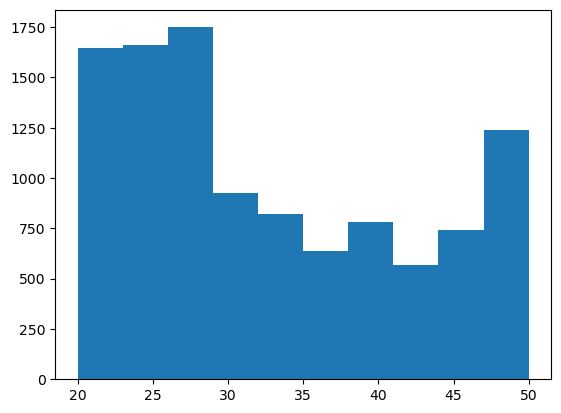

In [39]:
# Check that filtering 
import matplotlib.pyplot as plt
plt.hist(fitbir_data['GCS.Main.AgeYrs'])

In [40]:
fitbir_data['DemogrFITBIR.Subject Demographics.GenderTyp'].unique()

array(['Female'], dtype=object)

## Output JSON Format  <a name="Bii"></a>
See Swagger-UI https://fitbir.nih.gov/gateway/query-api/swagger-ui/index.html#/data/getInstancedDataJson for more information regarding this endpoint

In [41]:
queryurl ="https://" +  BRICSInstance  + "/gateway/query-api/data/json"

headers = {
    'accept': 'application/json',
    'Content-type': 'application/json',
    'Authorization':'Bearer ' + token }

In [42]:
query = requests.post(queryurl,headers=headers,json=filterForQuery)
query

<Response [200]>

In [43]:
print(f"Response: {query}")
print("Data received: " + query.headers["Content-Disposition"][21:96]) 

Response: <Response [200]>
Data received: query_result_GCS_join_DemogrFITBIR_2024-04-10T09-34-0711890295064841579210.


In [44]:
jsondata = query.json()
jsondata

[{'guid': 'TBITW423YBL',
  'forms': [{'name': 'GCSV1.2',
    'studyId': 'FITBIR-STUDY0000267',
    'datasetId': 'FITBIR-DATA0011942',
    'repeatableGroups': [{'name': 'Main',
      'data': [[{'GUID': 'TBITW423YBL'},
        {'SubjectIDNum': ''},
        {'AgeYrs': '27'},
        {'VitStatus': ''},
        {'VisitDate': ''},
        {'SiteName': '1'},
        {'DaysSinceBaseline': '0.740277778'},
        {'CaseContrlInd': 'Case'},
        {'GeneralNotesTxt': 'CAMRI'}]]},
     {'name': 'Form Administration',
      'data': [[[{'ContextType': 'Other, specify'},
         {'ContextTypeOTH': '2727'},
         {'DataSource': 'Other, specify'},
         {'DataSourceOTH': '21588'}]]]},
     {'name': 'Glasgow Coma Scale',
      'data': [[[{'GCSConfounderTyp': ''},
         {'GCSEyeRespnsScale': '3'},
         {'GCSMotorRespnsScale': '6'},
         {'GCSVerbalRspnsScale': '5'},
         {'GCSTotalScore': '14'},
         {'PupilReactivityLghtLftEyeReslt': 'Brisk'},
         {'PupilReactivityLghtRt